In [3]:
import pandas as pd
from pandas import DataFrame, Series
import wordcloud
import json
import matplotlib.pyplot as plt

In [4]:
with open("anthro.json","r") as file:
    data = json.loads(file.read())
df = DataFrame(data)
s = Series(df["interests"])
anth_words = []
[anth_words := anth_words + x for x in s]

[['Anthropology of religion', 'Islam', 'law', 'colonial power'],
 ['Anthropology of religion',
  'Islam',
  'law',
  'colonial power',
  'Knowledge production and dissemination',
  'scale',
  'complex institutions',
  'professional culture and practice',
  'training and apprenticeship',
  'therapeutic interventions and institutions',
  'animal-human interaction',
  'addiction and its treatment',
  'American Pragmatism'],
 ['Anthropology of religion',
  'Islam',
  'law',
  'colonial power',
  'Knowledge production and dissemination',
  'scale',
  'complex institutions',
  'professional culture and practice',
  'training and apprenticeship',
  'therapeutic interventions and institutions',
  'animal-human interaction',
  'addiction and its treatment',
  'American Pragmatism',
  'Sociocultural anthropology',
  'globalization and transnational processes',
  'mobility and migration',
  'economy and value',
  'ritual life',
  'material culture',
  'media and technology',
  'state regulatory r

In [5]:
additions = []
for i in range(len(anth_words)):
    anth_words[i] = anth_words[i].replace(u'\xa0', u' ')
    if any(x in anth_words[i] for x in [',',';','.']):
        split = [x.rstrip(' ').lstrip(' ') for x in anth_words[i].replace(".",";").replace(",",";").split(";")]
        anth_words[i] = split[0]
        additions += split[1:]
    anth_words[i] = anth_words[i].lstrip("and ")
anth_words += additions
anth_words
    

['Anthropology of religion',
 'Islam',
 'law',
 'colonial power',
 'Knowledge production and dissemination',
 'scale',
 'complex institutions',
 'professional culture and practice',
 'training and apprenticeship',
 'therapeutic interventions and institutions',
 'imal-human interaction',
 'iction and its treatment',
 'American Pragmatism',
 'Sociocultural anthropology',
 'globalization and transnational processes',
 'mobility and migration',
 'economy and value',
 'ritual life',
 'material culture',
 'media and technology',
 'state regulatory regimes',
 'Transdisciplinary anthropology',
 'rchaeology of the contemporary',
 'historical anthropology',
 'cities',
 'colonialism and capitalism',
 'informal economies',
 'sex',
 'eath',
 'isaster',
 'temporality',
 'utopia',
 'filmmaking',
 'Archaeology and ethnoarchaeology',
 'colonialism and postcolonial studies',
 'material culture theory',
 'lcohol and foodways',
 'rchitecture and urban landscapes',
 'economic anthropology',
 'migration and

In [6]:
with open("soci.json","r") as file:
    data2 = json.loads(file.read())
df2 = DataFrame(data2)
s2 = Series(df2["interests"])
soci_words = []
[soci_words := soci_words + x for x in s2]

[['professions and work',
  'urban sociology',
  'historical sociology',
  'methodology',
  'and general social theory'],
 ['professions and work',
  'urban sociology',
  'historical sociology',
  'methodology',
  'and general social theory',
  'spatial data science',
  'spatial econometrics',
  'computational social science',
  'regional science',
  'urban studies',
  'crime',
  'public health'],
 ['professions and work',
  'urban sociology',
  'historical sociology',
  'methodology',
  'and general social theory',
  'spatial data science',
  'spatial econometrics',
  'computational social science',
  'regional science',
  'urban studies',
  'crime',
  'public health',
  'Race',
  'Social Movements',
  'Work',
  'Professions',
  'Organizations',
  'Diversity in Higher Education'],
 ['professions and work',
  'urban sociology',
  'historical sociology',
  'methodology',
  'and general social theory',
  'spatial data science',
  'spatial econometrics',
  'computational social science',


In [7]:
additions = []
for i in range(len(soci_words)):
    word = soci_words[i]
    if "and" in word[:3]:
        new = word.replace("and","").lstrip(" ")
        soci_words[i] = new

for i in range(len(soci_words)):
    word = soci_words[i]
    if ";" in word or "." in word:
        split = [x.rstrip(' ').lstrip(' ') for x in word.replace(".",";").split(";")]
        soci_words[i] = split[0]
        additions += split[1:]
soci_words += additions
soci_words

['professions and work',
 'urban sociology',
 'historical sociology',
 'methodology',
 'general social theory',
 'spatial data science',
 'spatial econometrics',
 'computational social science',
 'regional science',
 'urban studies',
 'crime',
 'public health',
 'Race',
 'Social Movements',
 'Work',
 'Professions',
 'Organizations',
 'Diversity in Higher Education',
 'critical urban theory and capitalist urbanization',
 'hinterlands and global political ecology',
 'using decision-making theory to approach urban politics and other social phenomena',
 'transnational processes',
 'urban sociology',
 'social theory',
 'organizational theory',
 'political sociology',
 'the role of social movements and voluntary organizations in processes of institutional change',
 'knowing',
 'computational social science',
 'collective intelligence',
 'science of science',
 'skills and learning',
 'machine learning &amp',
 'human-machine intelligence',
 'human and machine languages',
 'fields and networks'

In [8]:
stringified_soci = ', '.join(soci_words)
stringified_anth = ', '.join(anth_words)

In [15]:
replacements_soci = {'sociology':'','Sociology':'',' theory':'theory','social ':'','of':'','studies':'','science':''}
for rem,rep in replacements_soci.items():
    stringified_soci = stringified_soci.replace(rem,rep)
stringified_soci

'pressions and work, urban , historical , methodology, general socialtheory, spatial data , spatial econometrics, computational , regional , urban , crime, public health, Race, Social Movements, Work, Pressions, Organizations, Diversity in Higher Education, critical urbantheory and capitalist urbanization, hinterlands and global political ecology, using decision-makingtheory to approach urban politics and other phenomena, transnational processes, urban , socialtheory, organizationaltheory, political , the role  movements and voluntary organizations in processes  institutional change, knowing, computational , collective intelligence,   , skills and learning, machine learning &amp, human-machine intelligence, human and machine languages, fields and networks, text and image analysis, the   data, immigration, race and ethnicity, identity, public policy, public opinion, quantitative methods, political , urban , socialtheory, transnational processes, inequality, cultural change, ways  knowin

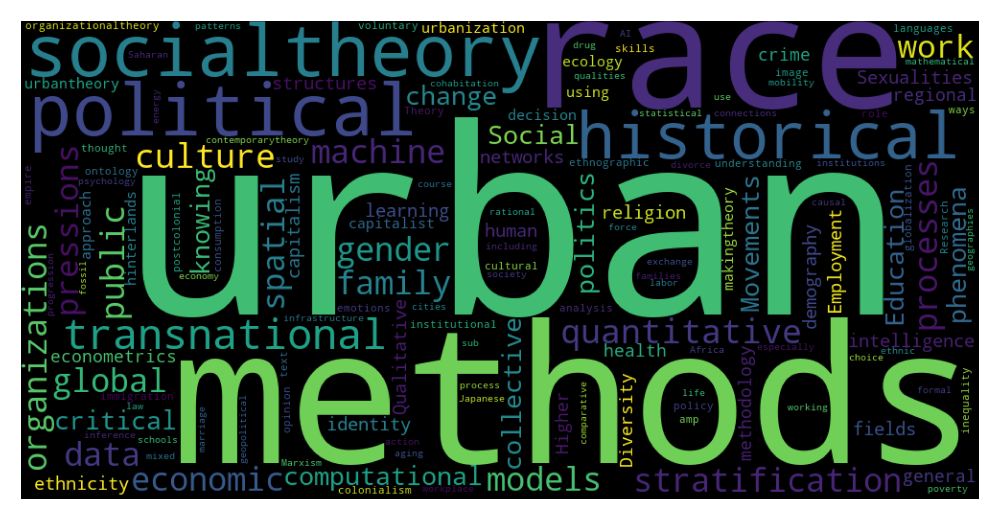

In [31]:
wc = wordcloud.WordCloud(width=1000, height=500, relative_scaling=0.1).generate(stringified_soci)
plt.figure(dpi=1200)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.savefig("soci_wc2.png")

In [11]:
replacements_anth = {'anthropology':'','Anthropology':'',' of ':' ','studies':'',' theory':'theory'}
for rem,rep in replacements_anth.items():
    stringified_anth = stringified_anth.replace(rem,rep)
stringified_anth

" religion, Islam, law, colonial power, Knowledge production and dissemination, scale, complex institutions, professional culture and practice, training and apprenticeship, therapeutic interventions and institutions, imal-human interaction, iction and its treatment, American Pragmatism, Sociocultural , globalization and transnational processes, mobility and migration, economy and value, ritual life, material culture, media and technology, state regulatory regimes, Transdisciplinary , rchaeology the contemporary, historical , cities, colonialism and capitalism, informal economies, sex, eath, isaster, temporality, utopia, filmmaking, Archaeology and ethnoarchaeology, colonialism and postcolonial , material culturetheory, lcohol and foodways, rchitecture and urban landscapes, economic , migration and diasporas, heritage, Celticism, science , ethnomusicology, Technology/nature/culture, cybernetic ontologies, infrastructure and design, Japan , biomimicry, experimental ecologies, Linguistic 

(-0.5, 999.5, 499.5, -0.5)

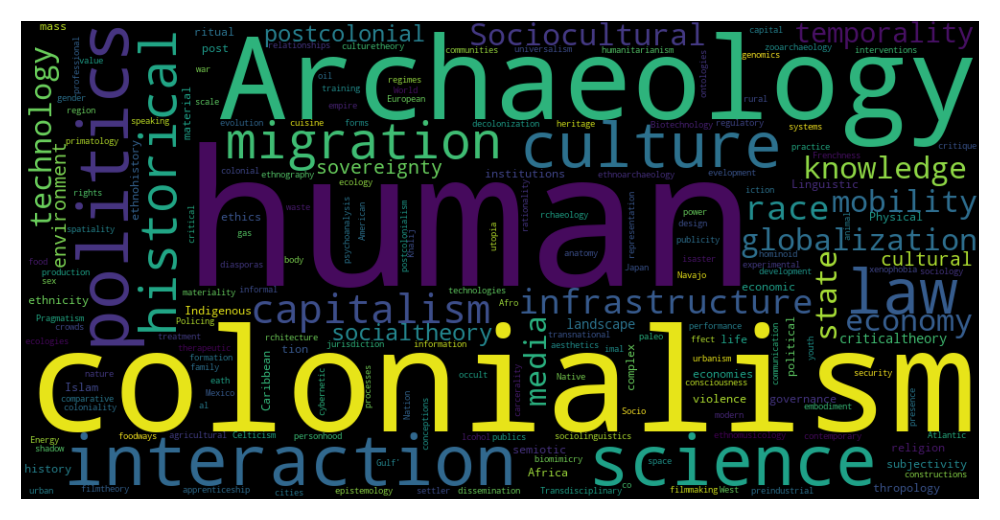

In [12]:
wc_a = wordcloud.WordCloud(width=1000, height=500).generate(stringified_anth)
plt.figure(dpi=1200)
plt.imshow(wc_a, interpolation="bilinear")
plt.axis("off")
#plt.savefig("anth_wc.png")